<a href="https://colab.research.google.com/github/TSeekasamit/deep-learning-tensorflow/blob/main/Census%20Income%20Prediction%20with%20TensorFlow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%html
<marquee style='width: 45%; color: blue; font-size: 250%;'><b>Welcome to DS521 Neural Networks and Deep Learning</b></marquee>

#<font color='Blue'>**DS521 NEURAL NETWORKS AND DEEP LEARNING**

**Project Name** : A Study of Factors Affecting Designing a Neural Network with TensorFlow </br>
**Project Owner** : Mr. Teerawit Seekasamit 62199130233
</br>
**Lecturer** : Assist.Prof. Dr.Taweechai Ouypornkochagorn taweechai@g.swu.ac.th
</br>
**Due to** : 6th Dec 2020 13.00, send to email taweechai@g.swu.ac.th
</font>


---

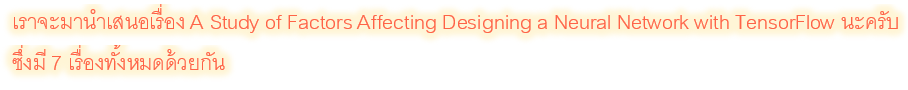

#<font color='green'>**1. Data Understanding**</font>
---

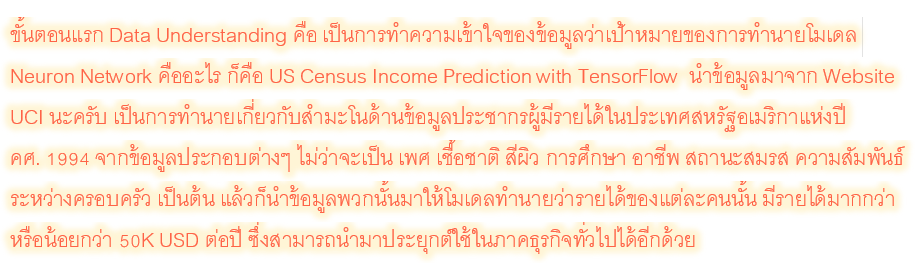

##<font color='orange'>**Problem Statement : Census Income Prediction**</font>

---
**Reference** : http://archive.ics.uci.edu/ml/datasets/Adult

The Census Income data was extracted from the 1994 American Census bureau database.

The prediction task is to determine whether whether income exceeds $50K/year based on census data.



##<font color='orange'>**Listing of attributes**</font>

---
<font color='blue'>**income_level :** (>50K, <=50K.) => Binary Classification Problem
</br>
**Number of Instances :** 48842 (including train and test data)
</br>
**Number of Attributes :** 14 (exclude target variable)
</br>
**Missing Values ? :** Yes
</font> </br>

Column Name | Description
--- | ---
age | The age of the individual
workclass | Work Class
fnlwgt | Final Weight is the number of people the census believes the entry represents
education | The highest level of education obtained
education_num | Education Number is the number of years of education
marital_status | Marital status of the individual
occupation | The occupation of the individual
relationship | Relationship in family
race | Race
sex | Gender : Female, Male
capital_gain | Capital gains recorded
capital_loss | Capital Losses recorded
hours_per_week | Hours worked per week
native_country | Country of origin of the individual
income | Income (whether or not an individual makes more than $50,000 annually


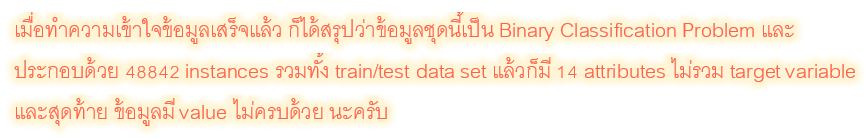

#<font color='green'>**2. Data Preparation**</font>

---

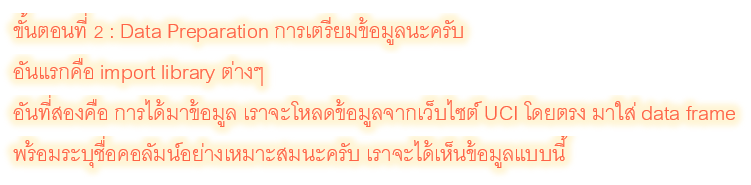

##<font color='purple'>2.1 Importing neccessary libraries </font>

---

In [2]:
#Helper libraries

import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

from sklearn.metrics import roc_curve, auc, roc_auc_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

#TensorFlow and tf.keras
import tensorflow as tf
print(tf.__version__)

2.3.0


##<font color='purple'>2.2 Gathering Dataset</font>
---

**Reference :** http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data

You could see attribute information to set column name to dataframe

In [3]:
#Set column names to dataframe
columns_name = ["age", "workclass", "fnlwgt", "education", "education_num", "marital_status", 
               "occupation", "relationship", "race", "sex", "capital_gain", 
               "capital_loss", "hours_per_week", "native_country", "income_level"]

In [4]:
#Loading the dataset for census income along with setting column names.
df = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data", header = None, names = columns_name)

#preview data
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income_level
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


#<font color='green'>**3. Data Exploration**</font>
---
**The purpose of Exploratory data analysis (EDA) :**  is to use summary statistics and visualizations to better understand data, and find clues about the tendencies of the data, its quality and to formulate assumptions and the hypothesis of our analysis.

**Reference :** Andrew Andrade https://datascienceguide.github.io/exploratory-data-analysis


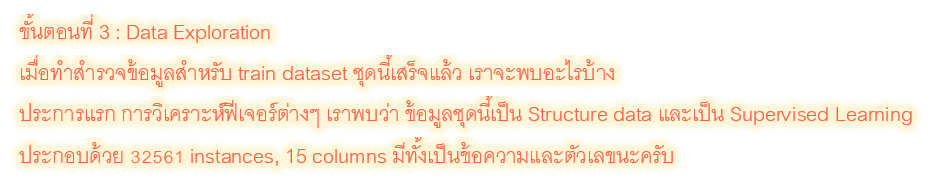

##<font color='purple'>3.1 Feature Analysis</font>
---
**Types of Data :** Structured data

**Number of Instances :** 32561

**Number of Columns :** 15

**Categorical Variables:** workclass, education, marital_status, occupation,
       relationship, race, sex, native_country, income_level **(9 columns)**

**Numerical Variables:** age, fnlwgt, education_num, capital_gain, capital_loss,
       hours_per_week **(6 columns)**

Column Name | Type | Note
--- | --- | ---
age | Numerical | range 17-90
workclass | Categorical | 9 categories
fnlwgt | Numerical | ID
education | Categorical | 16 categories
education_num | Numerical | range 1-16
marital_status | Categorical | 7 categories
occupation | Categorical | 15 categories
relationship | Categorical | 6 categories
race | Categorical | 5 categories
sex | Categorical | 2 categories
capital_gain | Numerical | Continous
capital_loss | Numerical | Continous
hours_per_week | Numerical | range 1 to 99
native_country | Categorical | 42 countries
income | Categorical | 2 categories






In [5]:
#print a full summary of the dataframe and exclude the null-counts.
df.info(verbose = True, null_counts = False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   age             int64 
 1   workclass       object
 2   fnlwgt          int64 
 3   education       object
 4   education_num   int64 
 5   marital_status  object
 6   occupation      object
 7   relationship    object
 8   race            object
 9   sex             object
 10  capital_gain    int64 
 11  capital_loss    int64 
 12  hours_per_week  int64 
 13  native_country  object
 14  income_level    object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [6]:
df.describe(include='number')

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [7]:
df.describe(include='object')

,workclass,education,marital_status,occupation,relationship,race,sex,native_country,income_level
count,32561,32561,32561,32561,32561,32561,32561,32561,32561
unique,9,16,7,15,6,5,2,42,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,27816,21790,29170,24720


##<font color='purple'>3.2 Imbalanced data</font>
---
คือ จำนวนของคลาสใดคลาสหนึ่งมีมากกว่าของจำนวนอีกคลาสหนึ่งมากเกินไป

Degree of this imbalanced data is Mild.

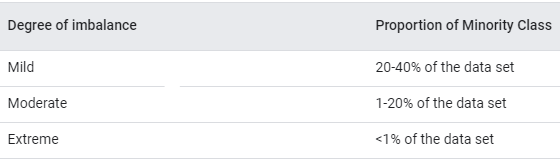
</br>**Reference** : https://developers.google.com/machine-learning/data-prep/construct/sampling-splitting/imbalanced-data

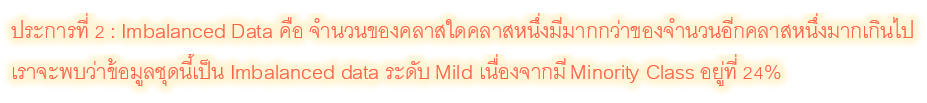

In [8]:
#Check Imbalanced data
df['income_level'].value_counts().to_frame()

,income_level
<=50K,24720
>50K,7841


In [9]:
df['income_level'].value_counts(normalize=True)*100

 <=50K    75.919044
 >50K     24.080956
Name: income_level, dtype: float64

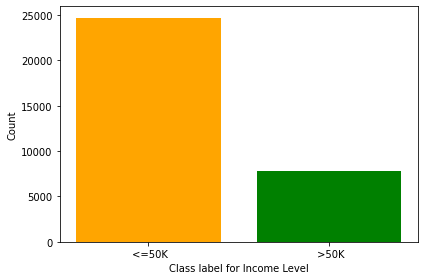

In [10]:
plt.bar(df['income_level'].value_counts(dropna=False).index.tolist(),
        df['income_level'].value_counts(dropna=False).values.tolist(),
        color=['orange', 'green'])

plt.ylabel('Count')
plt.xlabel('Class label for Income Level')
plt.tight_layout()

##<font color='purple'>3.3 Checking Missing Values</font>
---
There are no missing values (NaN) though, but should check inconsistent data as well

Check missing values using libary 'missingno'

Ref : https://www.geeksforgeeks.org/python-visualize-missing-values-nan-values-using-missingno-library/

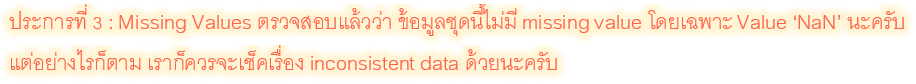

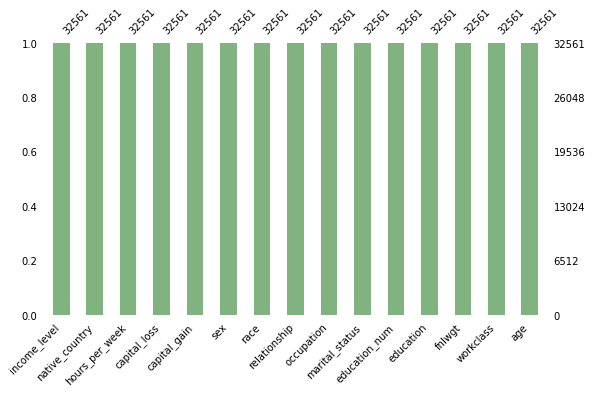

In [11]:
import missingno as msno
msno.bar(msno.nullity_filter(df, filter='bottom', n=len(df)),figsize=(9,5),color=(0.5, 0.7, 0.5),
         fontsize=(10),sort='descending')
plt.show()

In [12]:
#Check for Null data
df.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income_level      0
dtype: int64

##<font color='purple'>3.4 Finding Inconsistent Data</font>
---
After EDA, I found that there are 3 columns with having inconsistent value (?)
1. workclass
2. occupation
3. native_country

So, next step is handling on this.

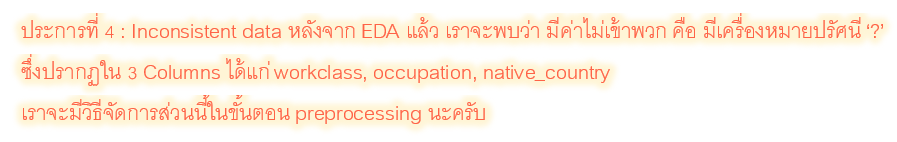

In [13]:
df['age'].unique()

array([39, 50, 38, 53, 28, 37, 49, 52, 31, 42, 30, 23, 32, 40, 34, 25, 43,
       54, 35, 59, 56, 19, 20, 45, 22, 48, 21, 24, 57, 44, 41, 29, 18, 47,
       46, 36, 79, 27, 67, 33, 76, 17, 55, 61, 70, 64, 71, 68, 66, 51, 58,
       26, 60, 90, 75, 65, 77, 62, 63, 80, 72, 74, 69, 73, 81, 78, 88, 82,
       83, 84, 85, 86, 87])

In [14]:
df['education_num'].unique()

array([13,  9,  7, 14,  5, 10, 12, 11,  4, 16, 15,  3,  6,  2,  1,  8])

In [15]:
df['workclass'].value_counts().to_frame()

,workclass
Private,22696
Self-emp-not-inc,2541
Local-gov,2093
?,1836
State-gov,1298
Self-emp-inc,1116
Federal-gov,960
Without-pay,14
Never-worked,7


In [16]:
df['occupation'].value_counts().to_frame()

,occupation
Prof-specialty,4140
Craft-repair,4099
Exec-managerial,4066
Adm-clerical,3770
Sales,3650
Other-service,3295
Machine-op-inspct,2002
?,1843
Transport-moving,1597
Handlers-cleaners,1370


In [17]:
df['native_country'].value_counts().to_frame()

,native_country
United-States,29170
Mexico,643
?,583
Philippines,198
Germany,137
Canada,121
Puerto-Rico,114
El-Salvador,106
India,100
Cuba,95


In [18]:
#print columns with having value '?'
for col in df.columns:
  if(df[df[col] == ' ?'][col].count() != 0):
    print(col,':', df[df[col] == ' ?'][col].count())

workclass : 1836
occupation : 1843
native_country : 583


##<font color='purple'>3.5 EDA with target variable (income_level)</font>
---




> **Group by 'sex'**


income_level
income_level sex                  
 <=50K        Female          9592
              Male           15128
 >50K         Female          1179
              Male            6662

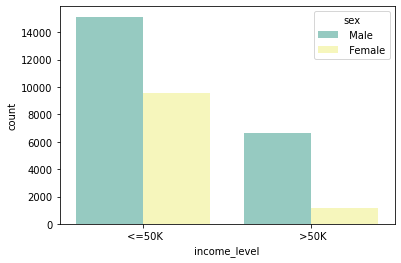

In [19]:
ax = sns.countplot(x="income_level", hue="sex", data=df, palette="Set3")
df.groupby(['income_level','sex']).agg({'income_level':'count'})

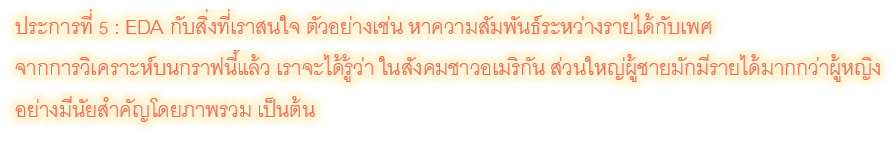

#<font color='green'>**4. Data Preprocessing**</font>
---

##<font color='purple'>4.1 Missing Value Treatment</font>
---
From 3.4 Finding Inconsisten Data, we found 3 columns with having value ?.

So replace '?' with 'NaN' values.

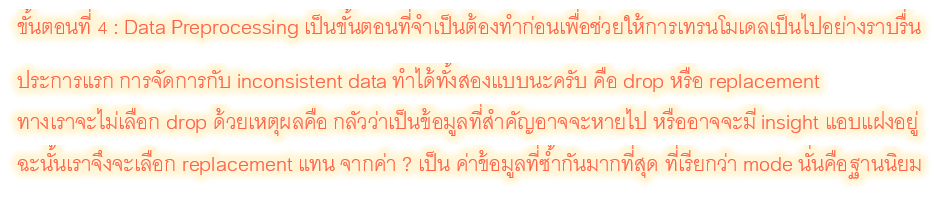

In [20]:
#encode ? as NaN values
df[df == ' ?'] = np.nan
#Check sum of missing value (NaN) 
df.isnull().sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education_num        0
marital_status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     583
income_level         0
dtype: int64

In [21]:
df['workclass'].value_counts(normalize=True)*100

 Private             73.868186
 Self-emp-not-inc     8.270138
 Local-gov            6.812042
 State-gov            4.224573
 Self-emp-inc         3.632221
 Federal-gov          3.124491
 Without-pay          0.045566
 Never-worked         0.022783
Name: workclass, dtype: float64

In [22]:
df['occupation'].value_counts(normalize=True)*100

 Prof-specialty       13.477440
 Craft-repair         13.343968
 Exec-managerial      13.236539
 Adm-clerical         12.272934
 Sales                11.882284
 Other-service        10.726610
 Machine-op-inspct     6.517351
 Transport-moving      5.198906
 Handlers-cleaners     4.459926
 Farming-fishing       3.235888
 Tech-support          3.021030
 Protective-serv       2.112768
 Priv-house-serv       0.485058
 Armed-Forces          0.029299
Name: occupation, dtype: float64

In [23]:
df['native_country'].value_counts(normalize=True)*100

 United-States                 91.218963
 Mexico                         2.010757
 Philippines                    0.619176
 Germany                        0.428420
 Canada                         0.378385
 Puerto-Rico                    0.356495
 El-Salvador                    0.331478
 India                          0.312715
 Cuba                           0.297079
 England                        0.281443
 Jamaica                        0.253299
 South                          0.250172
 China                          0.234536
 Italy                          0.228282
 Dominican-Republic             0.218900
 Vietnam                        0.209519
 Guatemala                      0.200138
 Japan                          0.193883
 Poland                         0.187629
 Columbia                       0.184502
 Taiwan                         0.159485
 Haiti                          0.137595
 Iran                           0.134467
 Portugal                       0.115705
 Nicaragua      

In [24]:
#Impute missing values with mode
#ฐานนิยม (Mode) คือ ค่าข้อมูลที่ซ้ำกันมากที่สุด
for col in ['workclass', 'occupation', 'native_country']:
    print("Impute missing values for", col ,"=>", df[col].dropna().mode().values[0])
    df[col].fillna(df[col].mode()[0], inplace=True)

Impute missing values for workclass =>  Private
Impute missing values for occupation =>  Prof-specialty
Impute missing values for native_country =>  United-States


In [25]:
#double check there is no missing value for NaN
df.isnull().sum().sum()

0

##<font color='purple'>4.2 Feature Engineering</font>
---

*   Convert integer valued (numeric) columns to floating point
*   Convert object columns to categorical columns before. So that it will be able to be numberic using cat.codes technique

**Reference** : https://stackoverflow.com/questions/28910851/python-pandas-changing-some-column-types-to-categories

**Reference** : https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.cat.codes.html



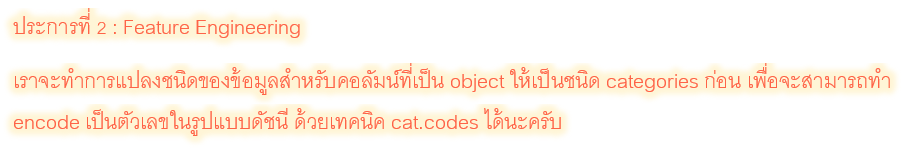

In [26]:
# Convert integer valued (numeric) columns to floating point
#num_columns = df.select_dtypes(['int64']).columns
#df[num_columns] = df[num_columns].apply(lambda x: x.astype('float32'))

# Convert object columns to categorical columns
cat_columns = df.select_dtypes(['object']).columns
df[cat_columns] = df[cat_columns].apply(lambda x: x.astype('category'))

#make copy to get mapping of cat.codes
df_cp = df.copy()

# Convert categorical columns to numeric
df[cat_columns] = df[cat_columns].apply(lambda x: x.cat.codes)

In [27]:
#preview data with cat.codes
df.head(10)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income_level
0,39,6,77516,9,13,4,0,1,4,1,2174,0,40,38,0
1,50,5,83311,9,13,2,3,0,4,1,0,0,13,38,0
2,38,3,215646,11,9,0,5,1,4,1,0,0,40,38,0
3,53,3,234721,1,7,2,5,0,2,1,0,0,40,38,0
4,28,3,338409,9,13,2,9,5,2,0,0,0,40,4,0
5,37,3,284582,12,14,2,3,5,4,0,0,0,40,38,0
6,49,3,160187,6,5,3,7,1,2,0,0,0,16,22,0
7,52,5,209642,11,9,2,3,0,4,1,0,0,45,38,1
8,31,3,45781,12,14,4,9,1,4,0,14084,0,50,38,1
9,42,3,159449,9,13,2,3,0,4,1,5178,0,40,38,1


In [28]:
df.dtypes

age               int64
workclass          int8
fnlwgt            int64
education          int8
education_num     int64
marital_status     int8
occupation         int8
relationship       int8
race               int8
sex                int8
capital_gain      int64
capital_loss      int64
hours_per_week    int64
native_country     int8
income_level       int8
dtype: object

> **Get Mapping of cat.codes**

**Reference :** https://stackoverflow.com/questions/30510562/get-mapping-of-categorical-variables-in-pandas

In [29]:
#Get Mapping of cat code
dict(enumerate(df_cp['workclass'].cat.categories))

{0: ' Federal-gov',
 1: ' Local-gov',
 2: ' Never-worked',
 3: ' Private',
 4: ' Self-emp-inc',
 5: ' Self-emp-not-inc',
 6: ' State-gov',
 7: ' Without-pay'}

In [30]:
dict(enumerate(df_cp['education'].cat.categories))

{0: ' 10th',
 1: ' 11th',
 2: ' 12th',
 3: ' 1st-4th',
 4: ' 5th-6th',
 5: ' 7th-8th',
 6: ' 9th',
 7: ' Assoc-acdm',
 8: ' Assoc-voc',
 9: ' Bachelors',
 10: ' Doctorate',
 11: ' HS-grad',
 12: ' Masters',
 13: ' Preschool',
 14: ' Prof-school',
 15: ' Some-college'}

In [31]:
dict(enumerate(df_cp['marital_status'].cat.categories))

{0: ' Divorced',
 1: ' Married-AF-spouse',
 2: ' Married-civ-spouse',
 3: ' Married-spouse-absent',
 4: ' Never-married',
 5: ' Separated',
 6: ' Widowed'}

In [32]:
dict(enumerate(df_cp['occupation'].cat.categories))

{0: ' Adm-clerical',
 1: ' Armed-Forces',
 2: ' Craft-repair',
 3: ' Exec-managerial',
 4: ' Farming-fishing',
 5: ' Handlers-cleaners',
 6: ' Machine-op-inspct',
 7: ' Other-service',
 8: ' Priv-house-serv',
 9: ' Prof-specialty',
 10: ' Protective-serv',
 11: ' Sales',
 12: ' Tech-support',
 13: ' Transport-moving'}

In [33]:
dict(enumerate(df_cp['race'].cat.categories))

{0: ' Amer-Indian-Eskimo',
 1: ' Asian-Pac-Islander',
 2: ' Black',
 3: ' Other',
 4: ' White'}

In [34]:
dict(enumerate(df_cp['sex'].cat.categories))

{0: ' Female', 1: ' Male'}

In [35]:
dict(enumerate(df_cp['native_country'].cat.categories))

{0: ' Cambodia',
 1: ' Canada',
 2: ' China',
 3: ' Columbia',
 4: ' Cuba',
 5: ' Dominican-Republic',
 6: ' Ecuador',
 7: ' El-Salvador',
 8: ' England',
 9: ' France',
 10: ' Germany',
 11: ' Greece',
 12: ' Guatemala',
 13: ' Haiti',
 14: ' Holand-Netherlands',
 15: ' Honduras',
 16: ' Hong',
 17: ' Hungary',
 18: ' India',
 19: ' Iran',
 20: ' Ireland',
 21: ' Italy',
 22: ' Jamaica',
 23: ' Japan',
 24: ' Laos',
 25: ' Mexico',
 26: ' Nicaragua',
 27: ' Outlying-US(Guam-USVI-etc)',
 28: ' Peru',
 29: ' Philippines',
 30: ' Poland',
 31: ' Portugal',
 32: ' Puerto-Rico',
 33: ' Scotland',
 34: ' South',
 35: ' Taiwan',
 36: ' Thailand',
 37: ' Trinadad&Tobago',
 38: ' United-States',
 39: ' Vietnam',
 40: ' Yugoslavia'}

**Note:** {0: ' <=50K', 1: ' >50K'}

In [36]:
dict(enumerate(df_cp['income_level'].cat.categories))

{0: ' <=50K', 1: ' >50K'}

##<font color='purple'>4.3 Correletion HeatMap after treatment</font>
---
**Correlation matrix between numerical variables (original) + target variables**

**The 3 most correlated feature** : Focus on Green color

1. income_level - education_num : 0.335154

2. income_level - age : 0.234037

3. income_level - hours_per_week : 0.229689

In [37]:
df_corr = df[['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss',
                    'hours_per_week','income_level']]

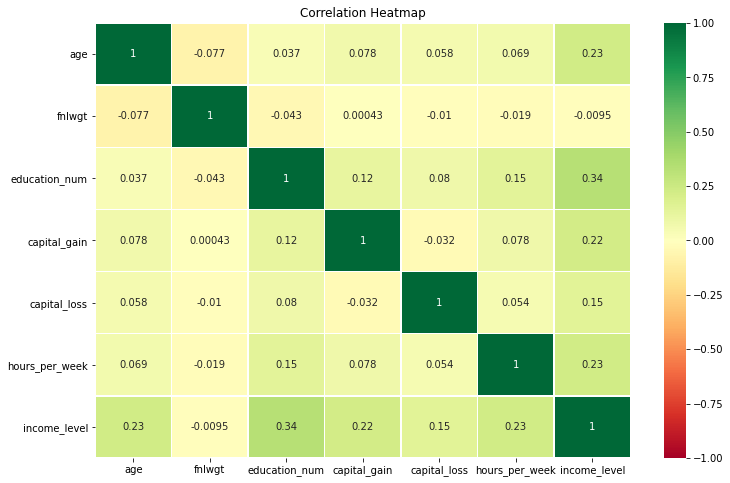

In [38]:
plt.figure(figsize=(12,8))
ax = sns.heatmap(df_corr.corr(), linewidth=0.5, vmin=-1,cmap='RdYlGn', annot=True)
plt.title('Correlation Heatmap')
plt.show()

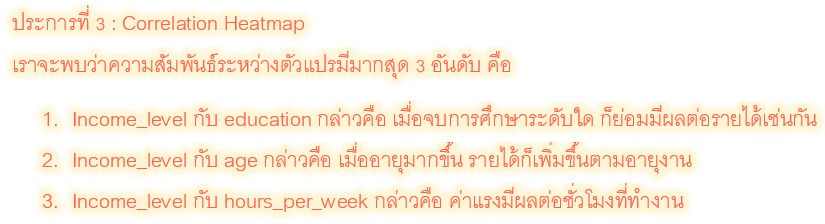

In [39]:
#Ref : https://stackoverflow.com/questions/17778394/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas/41453817
df_corr.corr().abs().unstack().sort_values(kind="quicksort").drop_duplicates()

fnlwgt          capital_gain      0.000432
                income_level      0.009463
capital_loss    fnlwgt            0.010252
fnlwgt          hours_per_week    0.018768
capital_gain    capital_loss      0.031615
education_num   age               0.036527
fnlwgt          education_num     0.043195
hours_per_week  capital_loss      0.054256
age             capital_loss      0.057775
hours_per_week  age               0.068756
fnlwgt          age               0.076646
capital_gain    age               0.077674
hours_per_week  capital_gain      0.078409
capital_loss    education_num     0.079923
capital_gain    education_num     0.122630
education_num   hours_per_week    0.148123
capital_loss    income_level      0.150526
income_level    capital_gain      0.223329
                hours_per_week    0.229689
                age               0.234037
education_num   income_level      0.335154
age             age               1.000000
dtype: float64

##<font color='purple'>4.4 Feature Selection</font>
---

Focus only on dropping some features that may not be neccessary.


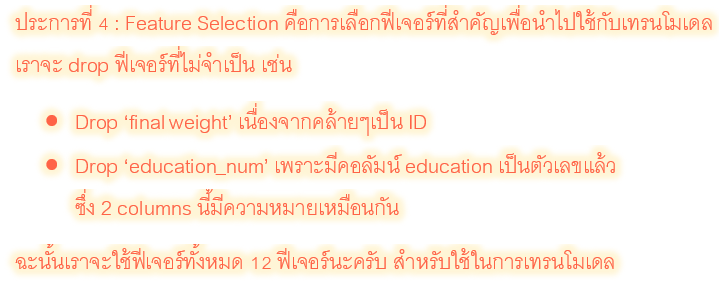

In [40]:
#df = df.drop(['fnlwgt','education_num','capital_gain','capital_loss'], 1)
df = df.drop(['fnlwgt','education_num'], 1)
df.head()

,age,workclass,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income_level
0,39,6,9,4,0,1,4,1,2174,0,40,38,0
1,50,5,9,2,3,0,4,1,0,0,13,38,0
2,38,3,11,0,5,1,4,1,0,0,40,38,0
3,53,3,1,2,5,0,2,1,0,0,40,38,0
4,28,3,9,2,9,5,2,0,0,0,40,4,0


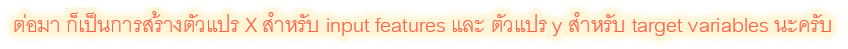

In [41]:
# creating input features and target variables
X = df.drop('income_level', axis=1)
y = df['income_level']
X.shape, y.shape

((32561, 12), (32561,))

##<font color='purple'>4.5 Try Resampling Imbalanced Data</font>
---
**Note:** {0: ' <=50K', 1: ' >50K'}

In [42]:
#Check Imbalanced data
df['income_level'].value_counts().to_frame()

,income_level
0,24720
1,7841


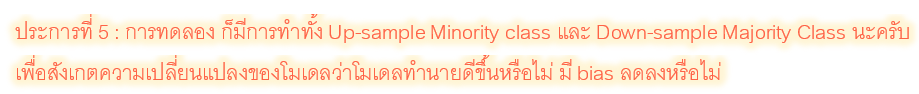

> **Up-sample Minority Class**




In [43]:
'''
XX = pd.concat([X, y], axis=1)

df_majority = XX[XX.income_level==0]
df_minority = XX[XX.income_level==1]

df_minority_upsampled = resample(df_minority, replace=True, 
                                 n_samples=len(df_majority), random_state=42)

df_upsampled = pd.concat([df_majority, df_minority_upsampled])

print(df_upsampled.income_level.value_counts())

X = df_upsampled.drop(['income_level'], axis=1)
y = df_upsampled['income_level']
'''

"\nXX = pd.concat([X, y], axis=1)\n\ndf_majority = XX[XX.income_level==0]\ndf_minority = XX[XX.income_level==1]\n\ndf_minority_upsampled = resample(df_minority, replace=True, \n                                 n_samples=len(df_majority), random_state=42)\n\ndf_upsampled = pd.concat([df_majority, df_minority_upsampled])\n\nprint(df_upsampled.income_level.value_counts())\n\nX = df_upsampled.drop(['income_level'], axis=1)\ny = df_upsampled['income_level']\n"

> **Down-sample Majority Class**

In [44]:
'''
XX = pd.concat([X, y], axis=1)

df_majority = XX[XX.income_level==0]
df_minority = XX[XX.income_level==1]

df_majority_downsampled = resample(df_majority, replace=False, 
                                   n_samples=len(df_minority), random_state=42)

df_downsampled = pd.concat([df_majority_downsampled, df_minority])

print(df_downsampled.income_level.value_counts())

X = df_downsampled.drop(['income_level'], axis=1)
y = df_downsampled['income_level']
'''

"\nXX = pd.concat([X, y], axis=1)\n\ndf_majority = XX[XX.income_level==0]\ndf_minority = XX[XX.income_level==1]\n\ndf_majority_downsampled = resample(df_majority, replace=False, \n                                   n_samples=len(df_minority), random_state=42)\n\ndf_downsampled = pd.concat([df_majority_downsampled, df_minority])\n\nprint(df_downsampled.income_level.value_counts())\n\nX = df_downsampled.drop(['income_level'], axis=1)\ny = df_downsampled['income_level']\n"

##<font color='purple'>4.6 Spliting Train, Validation, and Test set</font>
---
Split data into train set 80 % and test set 20% first.

Then, next into train set 80 % and validation set 20% from train set (80%)

**Reference** : https://datascience.stackexchange.com/questions/15135/train-test-validation-set-splitting-in-sklearn

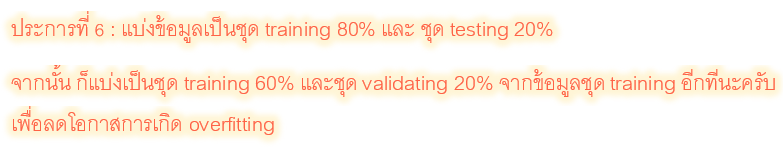

In [45]:
#split this first into train and test sets, and next into train and validation sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2
X_train.shape[0], X_valid.shape[0], X_test.shape[0]

(19536, 6512, 6513)

In [46]:
#Check sum from size(train+validate+test)
X_train.shape[0]+X_valid.shape[0]+X_test.shape[0]

32561

In [47]:
#Perfect
X.shape[0]

32561

##<font color='purple'>4.7 Feature Scaling</font>
---


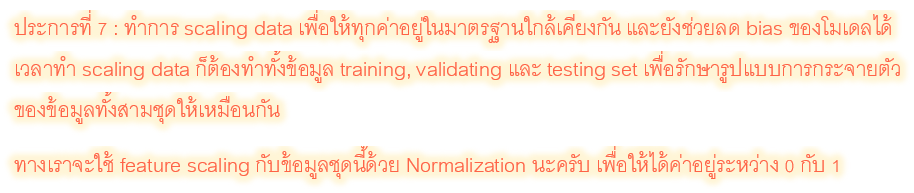

> **StandardScaler** :  Data Standardization [-X,X]


In [48]:
#Using StandardScaler to scale data for Standardization N(mean=0, standard deviation=1)
'''
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)
'''

'\nscaler = StandardScaler()\nX_train = scaler.fit_transform(X_train)\nX_valid = scaler.transform(X_valid)\nX_test = scaler.transform(X_test)\n'

> **MinMaxScaler** : Data Normalization [0,1]



In [49]:
#Use MinMaxScaler to scale data for data normalization btw min=0, max=1

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)


> **RobustScaler** : Can ignore outlier data




In [50]:
'''
scaler = RobustScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)
'''

'\nscaler = RobustScaler()\nX_train = scaler.fit_transform(X_train)\nX_valid = scaler.transform(X_valid)\nX_test = scaler.transform(X_test)\n'

In [51]:
#preview data with scaled data
X_train[:5]

array([[0.21917808, 0.42857143, 0.93333333, 0.66666667, 0.69230769,
        0.2       , 1.        , 1.        , 0.        , 0.        ,
        0.39795918, 0.95      ],
       [0.04109589, 0.42857143, 0.73333333, 0.66666667, 0.84615385,
        0.6       , 1.        , 0.        , 0.        , 0.        ,
        0.29591837, 0.95      ],
       [0.46575342, 0.14285714, 0.6       , 0.33333333, 0.69230769,
        1.        , 1.        , 0.        , 0.        , 0.        ,
        0.39795918, 0.95      ],
       [0.04109589, 0.42857143, 1.        , 0.66666667, 1.        ,
        0.6       , 1.        , 1.        , 0.        , 0.        ,
        0.29591837, 0.95      ],
       [0.28767123, 0.14285714, 0.73333333, 0.33333333, 0.15384615,
        0.        , 1.        , 1.        , 0.        , 0.        ,
        0.5       , 0.95      ]])

#<font color='green'>**5. Data Modeling**</font>
---
Keras API reference : https://keras.io/api/ 
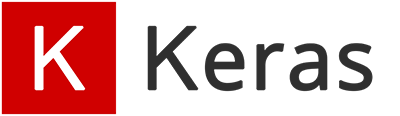
---



**Desiging  a Deep Learning Model**

---
* The model has 12 inputs
* 2 hidden Dense layers with 48 and 28 neurons using the ReLU activation function.
* The output layer has 1 neuron using a sigmoid activation function to output a value between 0 and 1
* The optimizer uses the binary cross-entropy loss function and adam poppular optimizer, which are appropriate for a binary classification problem

In [52]:
#num_features = len(X.columns)
num_features = X_train.shape[1]
num_features

12

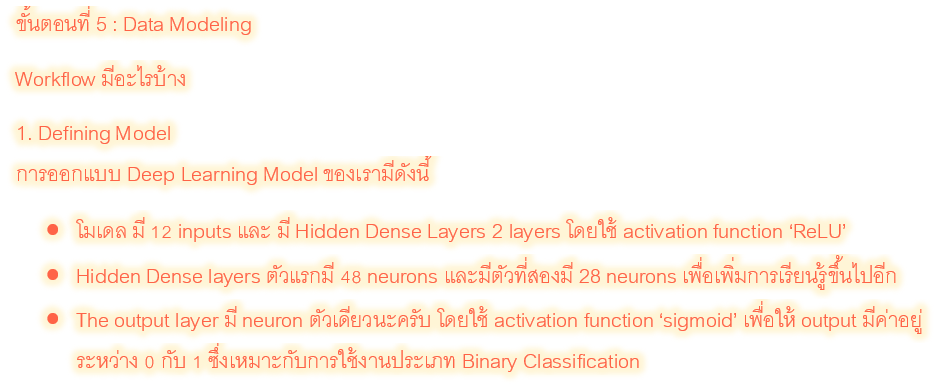

##<font color='purple'>5.1 Defining Model</font>
---


In [53]:
from keras.models import Sequential
from keras.layers import Dense, Dropout

#The Keras Python library makes creating deep learning models fast and easy. API for creating models.
model = Sequential(name = "my_seqential")

# Add a first Dense (fully-connected) layer. 
model.add(Dense(48, activation = 'relu', input_shape=(num_features,)))

# Using dropout can prevent overfitting
#model.add(Dropout(0.2))

# learn more complex relationships
model.add(Dense(24, activation = 'relu'))
#model.add(Dropout(0.2))

# suited for classification. Sigmoid is suited for binary classification and 
model.add(Dense(1, activation = 'sigmoid'))

##<font color='purple'>5.2 Configure Model</font>
---
After defining our model, the next step is to compile it. Compiling a model means configuring it for training.

*   **The Loss Function** - Use the binary cross-entropy loss which are appropriate for a binary classification problem
*   **The Optimizer** - helps us achieve better results for the loss function.
*   **Metrics** - used to evaluate the model. 

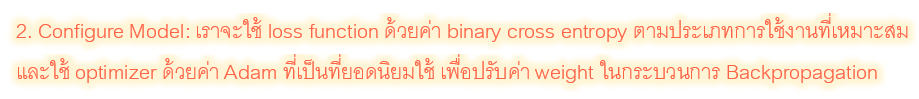

In [54]:
model.compile(loss = 'binary_crossentropy',
              optimizer = 'adam', #'sgd'
              metrics=['accuracy'])

model.summary()
#(48*12) + 48

Model: "my_seqential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 48)                624       
_________________________________________________________________
dense_1 (Dense)              (None, 24)                1176      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 25        
Total params: 1,825
Trainable params: 1,825
Non-trainable params: 0
_________________________________________________________________




> **Model Plotting**



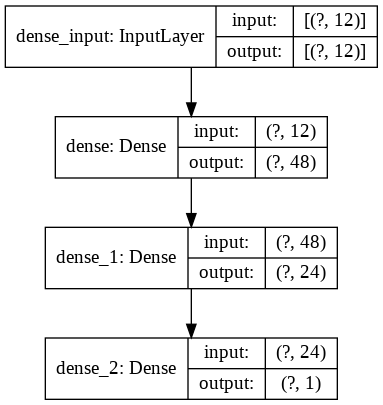

In [55]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True)

##<font color='purple'>5.3 Feed Model</font>
---


In [56]:
from datetime import datetime
import tensorboard
# Define the Keras TensorBoard callback.
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [57]:
epochs_input =  25#@param {type:"integer"}


In [58]:
batch_size_input =  32#@param ["16", "32", "64", "128"] {type:"raw", allow-input: true}

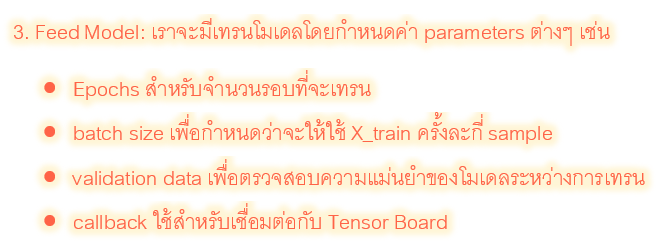

In [59]:
#history = model.fit(X_train, y_train, epochs = 50, batch_size = 64, validation_data=(X_valid, y_valid), verbose = 1)
history = model.fit(X_train, y_train, 
                    epochs = epochs_input, 
                    batch_size = batch_size_input, 
                    validation_data=(X_valid, y_valid),  
                    callbacks=[tensorboard_callback], verbose = 1)

Epoch 1/25
  1/611 [..............................] - ETA: 0s - loss: 0.6729 - accuracy: 0.6875WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
611/611 [==============================] - 1s 2ms/step - loss: 0.4599 - accuracy: 0.7794 - val_loss: 0.4188 - val_accuracy: 0.7970
Epoch 2/25
611/611 [==============================] - 1s 2ms/step - loss: 0.3936 - accuracy: 0.8051 - val_loss: 0.3916 - val_accuracy: 0.8010
Epoch 3/25
611/611 [==============================] - 1s 2ms/step - loss: 0.3715 - accuracy: 0.8114 - val_loss: 0.3751 - val_accuracy: 0.8107
Epoch 4/25
611/611 [==============================] - 1s 1ms/step - loss: 0.3633 - accuracy: 0.8167 - val_loss: 0.3714 - val_accuracy: 0.8160
Epoch 5/25
611/611 [==============================] - 1s 1ms/step - lo

In [60]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

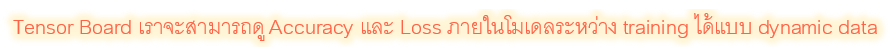

In [61]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [62]:
#after the fitted model, list key/attribute of the history object
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

##<font color='purple'>5.4 Evaluate the model</font>
---

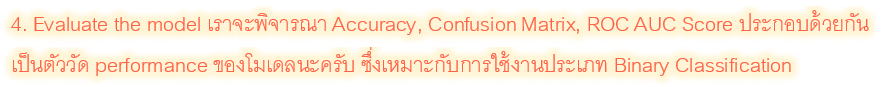



> **Accuracy**



In [63]:
#Verify the accuracy and loss
loss, accuracy = model.evaluate(X_test, y_test)
print('\nAccuracy: %.2f %%' % (accuracy*100))

204/204 [==============================] - 0s 944us/step - loss: 0.3442 - accuracy: 0.8277

Accuracy: 82.77 %


>  **Plotting Performance of the deep learning model during feeding**

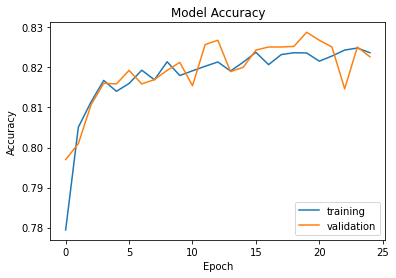

In [64]:
# Visualize History for Accuracy.
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['training', 'validation'], loc='lower right')

plt.show()

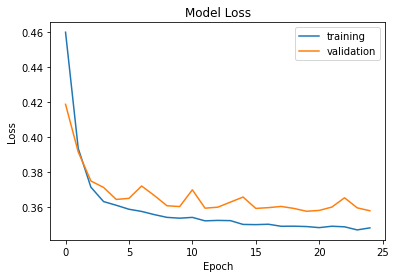

In [65]:
# Visualize History for Loss.
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'], loc='upper right')
plt.show()

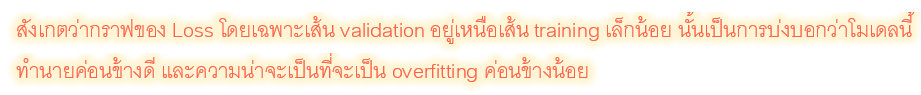

>  **Plotting Learning Curves**

Reference : Hands-On Machine Learning with Scikit-Learn and TensorFlow, E-book, page 301

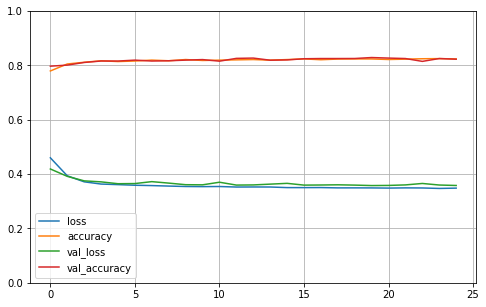

In [66]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()



> **ROC AUC Score**



In [67]:
y_pred = history.model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
roc_auc_score(y_test, y_pred, average='macro', sample_weight=None, max_fpr=None)

0.8866768583036166

>  **ROC Curve Analysis**

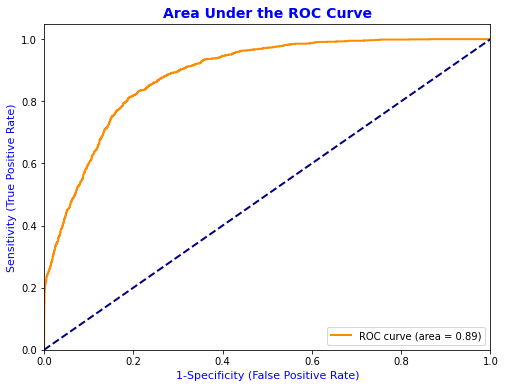

In [68]:
plt.figure(figsize=(8,6))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1-Specificity (False Positive Rate)', fontsize=11, color='Blue')
plt.ylabel('Sensitivity (True Positive Rate)', fontsize=11, color='Blue')
plt.title('Area Under the ROC Curve', fontweight='bold', fontsize=14, color='Blue')
plt.legend(loc="lower right")
plt.show()

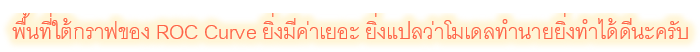

##<font color='purple'>5.5 Make Predictions.</font>
---

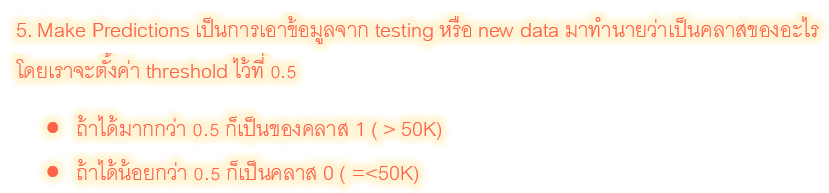

In [69]:
#numpy.set_printoptions(threshold=sys.maxsize)
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).squeeze().astype(int)



> **Prediction**



In [124]:
y_pred[:20]

array([0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0])



> **Actual Value**



In [125]:
y_test[:20].astype(int).values[:20]

array([0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0])

In [126]:
df_y_test = y_test[:20].astype(int).values[:20]



> **Prediction VS Actual Value**

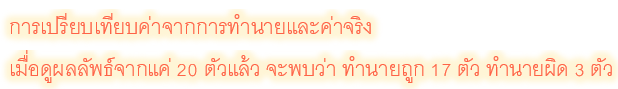

In [128]:
i = 0
for col in y_pred[:20]:
 print('Make Prediction : ', col, ',  Actual Value : ', df_y_test[i])
 i = i + 1

Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  1 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  1
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  1 ,  Actual Value :  1
Make Prediction :  1 ,  Actual Value :  1
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  1 ,  Actual Value :  1
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  1
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  1 ,  Actual Value :  1
Make Prediction :  0 ,  Actual Value :  0
Make Prediction :  1 ,  Actual Value :  1
Make Prediction :  0 ,  Actual Value :  0




> **Confusion Matrix**

**Reference :** http://rasbt.github.io/mlxtend/user_guide/plotting/plot_confusion_matrix/



In [72]:
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:\n", cm)


Confusion Matrix:
 [[4586  356]
 [ 766  805]]


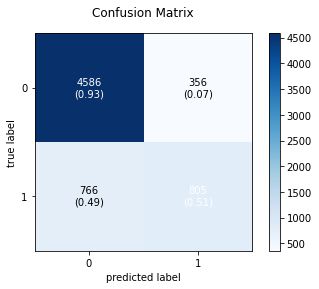

In [73]:
fig, ax = plot_confusion_matrix(conf_mat=cm, show_absolute=True,show_normed=True, colorbar=True)
ax.set_title('Confusion Matrix');
plt.show()

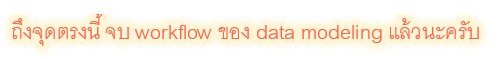

#<font color='green'>**6. Deployment**</font>
---
**Optional :** Share knowledge regarding TensorFlow Lite

**Reference :** https://www.tensorflow.org/lite/convert

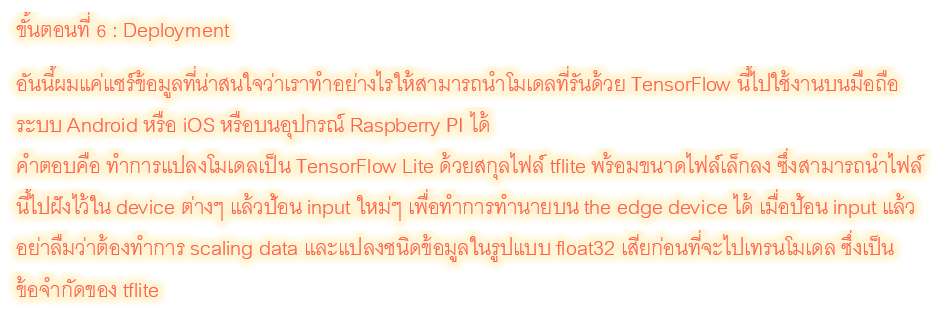

In [74]:
# Convert s SavedModel into a TensorFlow Lite model (tflite) which can be deploy with the edge device such as Android, iOS, Rasberry PI
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /tmp/tmp7zkmeq44/assets


#<font color='green'>**7. The Experiment**</font>
---

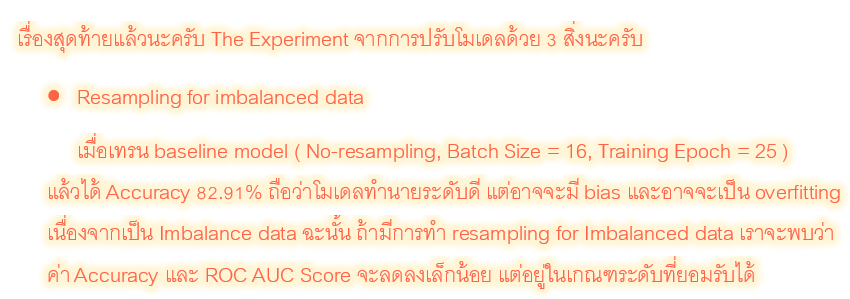

###**Tuning parameter :** Resampling for Imbalance data



> **No-resampling** (BASELINE MODEL)

> <font color = 'blue'> Batch Size = 16, Training Epoch = 25, Accuracy = 82.91%, ROC AUC Score = 0.8905
---

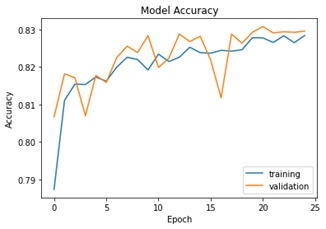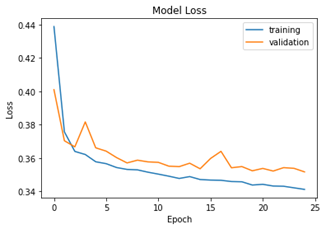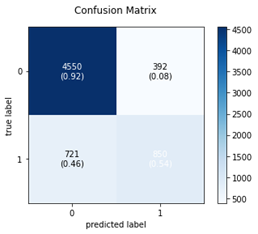

> **Up-sample Minority Class**

> <font color = 'blue'> Batch Size = 16, Training Epoch = 25, Accuracy = 80.81%, ROC AUC Score = 0.8921
---

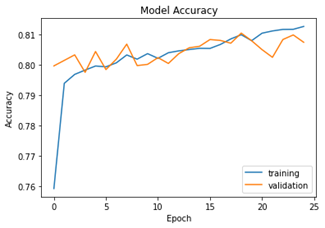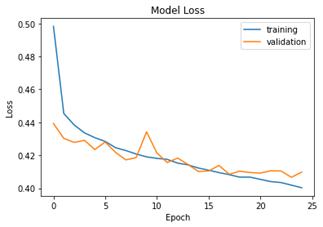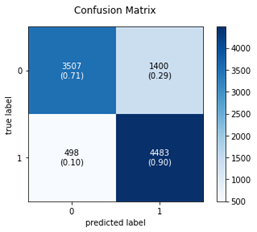

> **Down-sample Majority Class**

> <font color = 'blue'> Batch Size = 16, Training Epoch = 25, Accuracy = 79.28%, ROC AUC Score = 0.87806
---

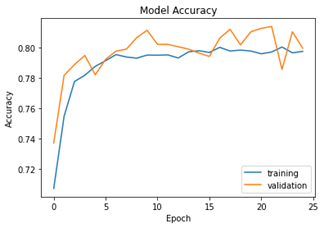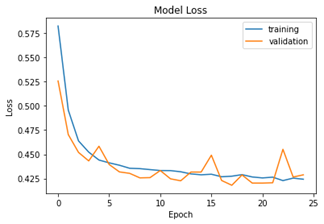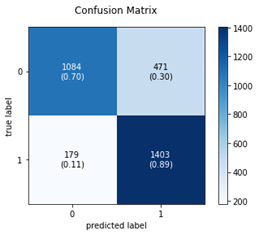

เมื่อเทรน baseline model ( No-resampling, Batch Size = 16, Training Epoch = 25 ) แล้วได้ Accuracy 82.91% 

ถือว่าโมเดลทำนายระดับดี แต่อาจจะมี bias และอาจจะเป็น overfitting 
เนื่องจากเป็น Imbalance data 

ฉะนั้น ถ้ามีการทำ resampling for Imbalanced data 
เราจะพบว่าค่า Accuracy และ ROC AUC Score 

จะลดลงเล็กน้อย แต่อยู่ในเกณฑระดับที่ยอมรับได้

---

###**Tuning parameter :** Batch Size and Training Epoch

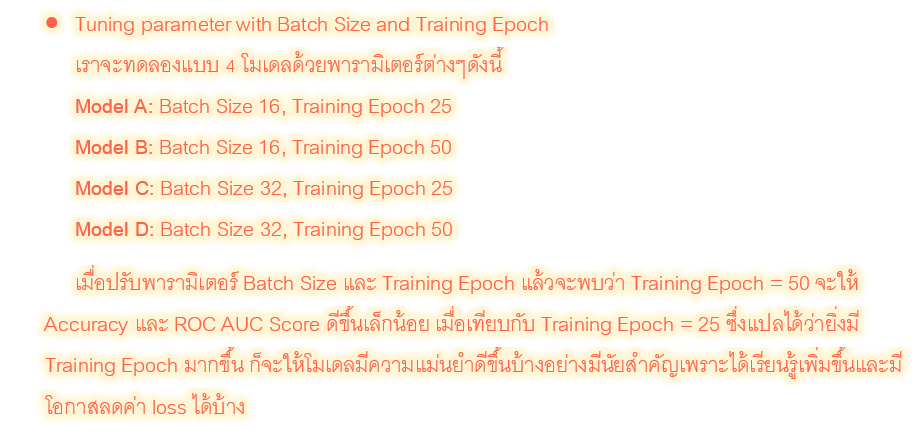

> <font color = 'blue'> Batch Size = 16, Training Epoch = 50, Accuracy = 84.03%, ROC AUC Score = 0.89503

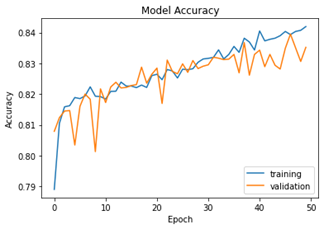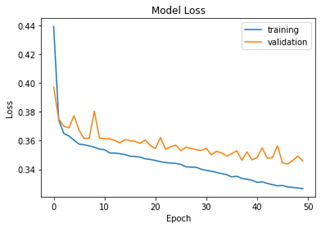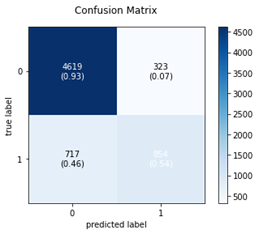

> <font color = 'blue'> Batch Size = 32, Training Epoch = 25, Accuracy = 82.53%, ROC AUC Score = 0.88727

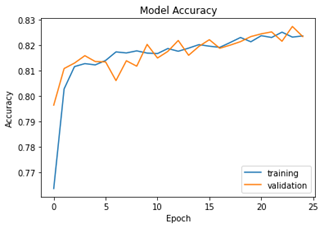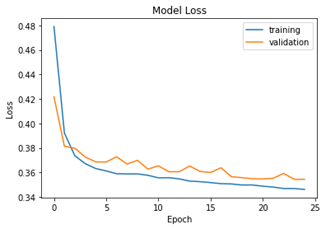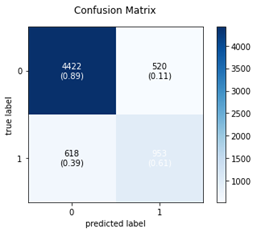

> <font color = 'blue'> Batch Size = 32, Training Epoch = 50, Accuracy = 83.29%, ROC AUC Score = 0.89358

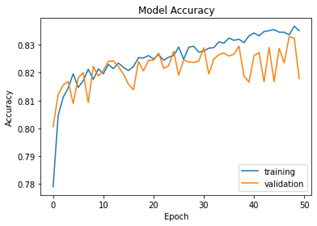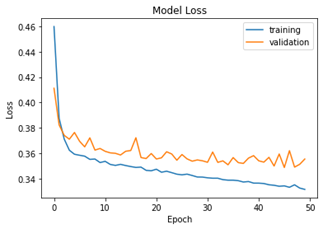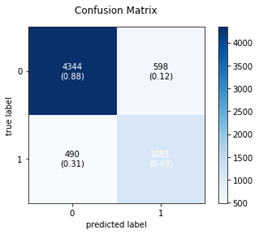


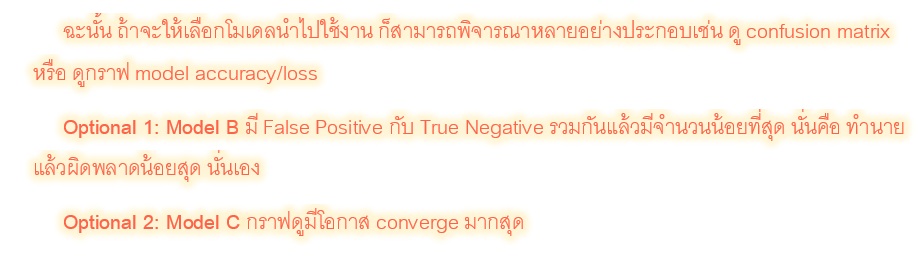

**Model A :** Batch Size = 16, Training Epoch = 25, Accuracy = 82.91%, ROC AUC Score = 0.8905

**Model B :** Batch Size = 16, Training Epoch = 50, Accuracy = 84.03%, ROC AUC Score = 0.88503

**Model C :** Batch Size = 32, Training Epoch = 25, Accuracy = 82.53%, ROC AUC Score = 0.88727

**Model D :** Batch Size = 32, Training Epoch = 50, Accuracy = 83.29%, ROC AUC Score = 0.89358

เมื่อปรับพารามิเตอร์ Batch Size และ Training Epoch แล้วจะพบว่า  Training Epoch = 50 จะให้ Accuracy และ ROC AUC Score ดีขึ้นเล็กน้อย เมื่อเทียบกับ Training Epoch = 25 ซึ่งแปลได้ว่ายิ่งมี Training Epoch มากขึ้น ก็จะให้โมเดลมีความแม่นยำดีขึ้นบ้างอย่างมีนัยสำคัญ

ฉะนั้น ถ้าจะให้เลือกโมเดลนำไปใช้งาน ก็สามารถพิจารณาหลายอย่างประกอบเช่น ดู confusion matrix หรือ ดูกราฟ model accuracy/loss  

**Optional 1 :** Model B มี False Positive กับ True Negative รวมกันแล้วมีจำนวนน้อยที่สุด นั่นคือ ทำนายแล้วผิดพลาดน้อยสุด นั่นเอง

**Optional 2 :** Model C กราฟดูมีโอกาส converge มากสุด 


###**Tuning parameter :** Dropout 

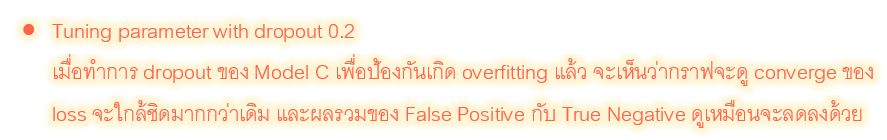

> <font color = 'blue'> Model C, Dropout = 0.2, Accuracy = 82.91%, ROC AUC Score = 0.8892

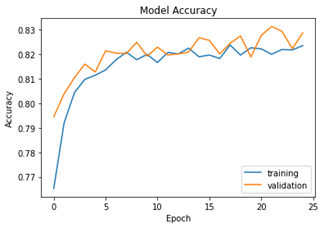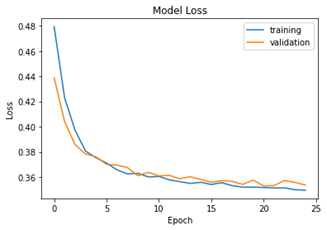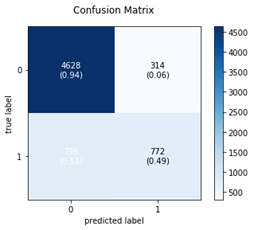

เมื่อทำการ dropout ของ Model C เพื่อป้องกันเกิด overfitting แล้ว จะเห็นว่ากราฟจะดู converge ของ loss จะใกล้ชิดมากกว่าเดิม และผลรวมของ False Positive กับ True Negative ดูเหมือนจะลดลงด้วย

---